## Random forest model in weather prediction

### Import Libraries and data frames

In [71]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree
from sklearn.model_selection import train_test_split

In [2]:
path = r'C:\Users\kshifera\Desktop\CF_Course\Specialization\Project\Data Sets'

In [22]:
#import the cleaned dataframe from Task 2.2
station = pd.read_csv(os.path.join(path, 'cleaned_dated.csv'))

In [23]:
station.head()

,Unnamed: 0,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,0,19600101,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,1,19600102,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,2,19600103,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,3,19600104,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,4,19600105,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [24]:
#drop 'Unnamed:0' column
station = station.drop(['Unnamed: 0'], axis=1)

In [25]:
station.head()

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,7,0.85,1.018,0.32,0.09,0.7,6.5,0.8,10.9,...,4.9,5,0.88,1.0003,0.45,0.34,4.7,8.5,6.0,10.9
1,19600102,6,0.84,1.018,0.36,1.05,1.1,6.1,3.3,10.1,...,5.0,7,0.91,1.0007,0.25,0.84,0.7,8.9,5.6,12.1
2,19600103,8,0.90,1.018,0.18,0.30,0.0,8.5,5.1,9.9,...,4.1,7,0.91,1.0096,0.17,0.08,0.1,10.5,8.1,12.9
3,19600104,3,0.92,1.018,0.58,0.00,4.1,6.3,3.8,10.6,...,2.3,7,0.86,1.0184,0.13,0.98,0.0,7.4,7.3,10.6
4,19600105,6,0.95,1.018,0.65,0.14,5.4,3.0,-0.7,6.0,...,4.3,3,0.80,1.0328,0.46,0.00,5.7,5.7,3.0,8.4


In [18]:
#import answers dataframe
picnic = pd.read_csv(os.path.join(path, 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))

In [19]:
picnic.head()

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [28]:
station.shape

(22950, 136)

### Filter data into 1970s and 1980s, first for the weather data and then for the answers data frame

In [89]:
# filter weather data of the 1970s decade
station_70s = station[station['DATE'].astype(str).str.startswith('197')] 

In [90]:
station_70s

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
3653,19700101,8,0.83,1.018,0.18,0.00,0.0,-3.6,-4.1,-2.4,...,-4.9,7,0.78,1.0156,0.28,0.18,0.6,3.2,-0.7,5.8
3654,19700102,5,0.77,1.018,0.18,0.00,0.0,-4.1,-5.3,-1.9,...,-1.2,6,0.93,1.0091,0.32,0.17,2.0,4.7,0.7,8.6
3655,19700103,3,0.76,1.018,0.66,0.00,5.9,-2.2,-7.5,3.8,...,-6.9,4,0.86,1.0048,0.34,0.20,1.7,5.4,2.6,8.1
3656,19700104,6,0.84,1.018,0.18,2.03,0.0,-0.8,-4.3,0.6,...,-3.6,1,0.74,1.0053,0.56,0.23,6.3,1.9,-0.2,3.9
3657,19700105,8,0.91,1.018,0.18,0.65,0.0,2.2,-0.1,8.1,...,-13.0,3,0.86,1.0047,0.49,0.17,4.4,2.2,-2.0,6.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,19791227,7,0.74,1.018,0.63,0.07,5.6,2.2,-0.3,4.6,...,2.0,7,0.78,0.9978,0.24,0.22,0.6,6.7,6.1,9.0
7301,19791228,7,0.85,1.018,0.32,0.10,0.8,3.5,0.5,9.6,...,2.4,4,0.81,1.0062,0.26,0.47,1.7,6.3,4.6,8.0
7302,19791229,7,0.79,1.018,0.30,0.29,0.6,3.7,1.5,5.7,...,2.4,5,0.74,1.0055,0.28,0.31,2.5,5.5,4.0,7.0
7303,19791230,6,0.87,1.018,0.39,1.14,1.5,2.2,0.5,4.7,...,2.4,4,0.82,1.0125,0.41,0.02,4.6,4.6,1.2,8.0


In [91]:
# drop the 'DATE' column
station_70s = station_70s.drop(['DATE'], axis=1)

In [92]:
station_70s.shape

(3652, 135)

In [36]:
# filter weather data of the 1980s decade
station_80s = station[station['DATE'].astype(str).str.startswith('198')] 

In [37]:
station_80s

,DATE,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,...,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
7305,19800101,6,0.83,1.0180,0.40,0.01,1.6,-0.8,-4.4,1.2,...,1.1,6,0.90,1.0130,0.17,0.05,0.0,4.4,2.1,6.0
7306,19800102,5,0.84,1.0180,0.34,0.09,0.9,-1.7,-4.0,0.6,...,-1.2,7,0.89,1.0195,0.12,1.48,0.0,6.4,1.0,11.5
7307,19800103,8,0.80,1.0180,0.44,0.07,2.0,-0.6,-3.7,1.3,...,-5.0,8,0.95,1.0058,0.13,0.60,0.0,9.2,6.2,12.2
7308,19800104,8,0.94,1.0180,0.18,0.43,0.0,-0.9,-2.2,2.2,...,-5.4,5,0.80,1.0034,0.30,0.50,1.5,7.7,5.8,9.2
7309,19800105,8,0.90,1.0180,0.25,0.26,0.2,3.0,0.5,5.3,...,0.2,7,0.79,1.0134,0.22,0.03,0.1,7.6,6.1,9.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,19891227,6,0.87,1.0157,0.49,0.00,4.0,-0.9,-2.4,1.8,...,4.0,6,0.79,1.0105,0.22,0.12,0.1,6.0,1.8,10.1
10954,19891228,3,0.84,1.0196,0.54,0.00,6.4,-1.1,-2.8,1.8,...,2.2,8,0.84,1.0134,0.18,0.05,0.3,9.3,7.5,11.0
10955,19891229,4,0.85,1.0224,0.52,0.00,5.5,-1.7,-4.5,1.3,...,0.4,8,0.86,1.0110,0.12,1.10,0.0,10.1,8.8,11.4
10956,19891230,0,0.83,1.0233,0.57,0.00,6.6,-2.1,-4.3,1.6,...,-0.5,8,0.84,1.0138,0.16,0.49,0.1,9.9,8.2,10.8


In [38]:
# drop the 'DATE' column
station_80s = station_80s.drop(['DATE'], axis=1)

In [51]:
station_80s.shape

(3653, 135)

In [93]:
# filter answers dataframe to the 1970s decade
picnic_70s = picnic[station['DATE'].astype(str).str.startswith('197')] 

In [94]:
picnic_70s

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
3653,19700101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3654,19700102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3655,19700103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3656,19700104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3657,19700105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7300,19791227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7301,19791228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7302,19791229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7303,19791230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [95]:
# drop the 'DATE' column
picnic_70s = picnic_70s.drop(['DATE'], axis=1)

In [96]:
picnic_70s.shape

(3652, 15)

In [45]:
# filter answers dataframe to the 1980s decade
picnic_80s = picnic[station['DATE'].astype(str).str.startswith('198')] 

In [46]:
picnic_80s

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
7305,19800101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7306,19800102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7307,19800103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7308,19800104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7309,19800105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10953,19891227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10954,19891228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10955,19891229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10956,19891230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [47]:
# drop the 'DATE' column
picnic_80s = picnic_80s.drop(['DATE'], axis=1)

In [50]:
picnic_80s.shape

(3653, 15)

### Create Matrices

In [98]:
# Combine 15 columns in answers data frame for 1970s into single column
y70 = picnic_70s.max(axis=1)


In [99]:
# correct shape
y70 = y70.to_numpy().reshape(-1)
y70.shape

(3652,)

In [64]:
# Combine 15 columns in answers data frame for 1980s into single column
y80 = picnic_80s.max(axis=1)

In [65]:
# correct shape
y80 = y80.to_numpy().reshape(-1)
y80.shape

(3653,)

In [100]:
# X matrix for 1970s
X70 = station_70s.to_numpy()

In [67]:
# X matric for 1980s
X80 = station_80s.to_numpy()

In [101]:
# Check shapes for 1970s
print(X70.shape)
print(y70.shape)

(3652, 135)
(3652,)


In [69]:
# Check shapes for 1980s
print(X80.shape)
print(y80.shape)

(3653, 135)
(3653,)


In [102]:
# Split data into training and test data sets for 1990s
X_train70, X_test70, y_train70, y_test70 = train_test_split(X70, y70, random_state=42)

In [103]:
# Check shapes
print(X_train70.shape, y_train70.shape)
print(X_test70.shape, y_test70.shape)

(2739, 135) (2739,)
(913, 135) (913,)


In [74]:
# Split data into training and test data sets for 1990s
X_train80, X_test80, y_train80, y_test80 = train_test_split(X80, y80, random_state=42)

In [75]:
# Check shapes
print(X_train80.shape, y_train80.shape)
print(X_test80.shape, y_test80.shape)

(2739, 135) (2739,)
(914, 135) (914,)


### Create Random Forests

#### 1970s

In [104]:
# creating a RF classifier
clf70 = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf70.fit(X_train70, y_train70)

RandomForestClassifier()

In [105]:
# performing predictions on the test dataset
y_pred70 = clf70.predict(X_test70)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test70, y_pred70))

Model Accuracy:  0.9507119386637459


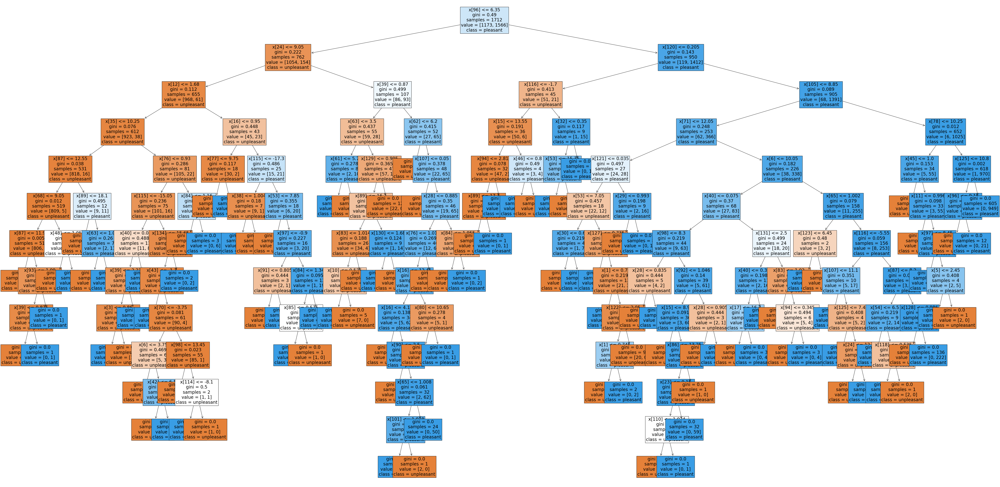

In [107]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf70.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

#### 1980s

In [108]:
# creating a RF classifier
clf80 = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf80.fit(X_train80, y_train80)

RandomForestClassifier()

In [109]:
# performing predictions on the test dataset
y_pred80 = clf80.predict(X_test80)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test80, y_pred80))

Model Accuracy:  0.9649890590809628


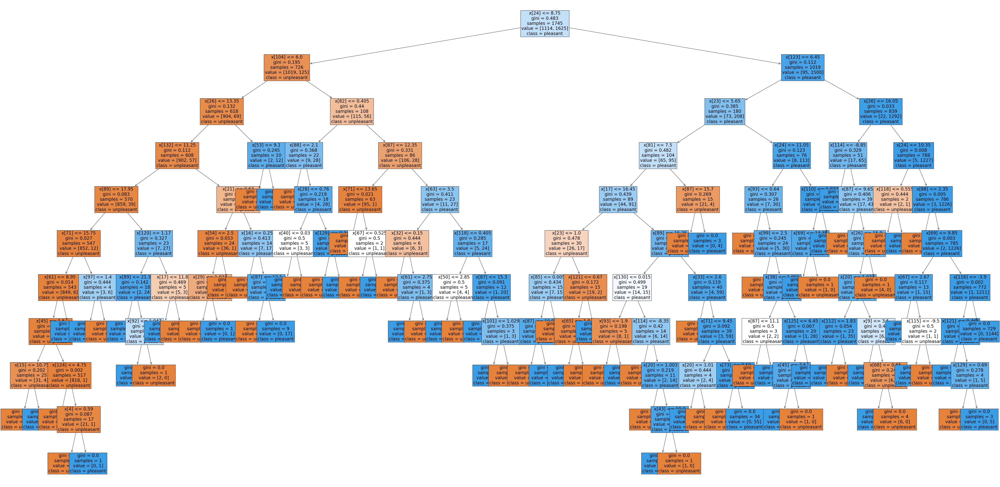

In [110]:
fig = plt.figure(figsize=(80,40))
plot_tree(clf80.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

### Feature Importances

#### 1970s

In [112]:
np.set_printoptions(threshold=np.inf)
importance70 = clf70.feature_importances_
print(importance70)

[0.00054336 0.00105762 0.         0.00248602 0.00089917 0.00068668
 0.05846215 0.00209623 0.01707524 0.00113098 0.00344857 0.00145758
 0.00448794 0.00286838 0.00248465 0.01553982 0.00435818 0.02534957
 0.00088802 0.00101552 0.00141166 0.00531209 0.00102382 0.00145385
 0.022542   0.02160667 0.06931935 0.00039294 0.00137015 0.00066397
 0.0021225  0.00107998 0.00107064 0.00273898 0.00102355 0.02441252
 0.00076612 0.00075578 0.00100151 0.00328926 0.00104515 0.00104573
 0.01282192 0.00073781 0.04280915 0.00051601 0.00146901 0.00122043
 0.0029921  0.00053949 0.00102795 0.00177294 0.00104876 0.00786211
 0.00052135 0.00071987 0.00077185 0.01179693 0.00055443 0.0006385
 0.0450257  0.00694226 0.04561996 0.00052537 0.00182418 0.00173044
 0.00250275 0.00075447 0.00128602 0.07080851 0.00767421 0.04325434
 0.00048126 0.00088759 0.00124279 0.00158893 0.00086024 0.00076985
 0.01941551 0.00275108 0.04201527 0.00146591 0.00473311 0.00201629
 0.00768746 0.00206327 0.00614136 0.04483256 0.00543818 0.07353

In [113]:
np.set_printoptions(threshold=1000)

In [117]:
# Reshape the feature

newimportance70 = importance70.reshape(-1,15,9)
print(newimportance70.shape)
newimportance70

(1, 15, 9)


array([[[0.00054336, 0.00105762, 0.        , 0.00248602, 0.00089917,
         0.00068668, 0.05846215, 0.00209623, 0.01707524],
        [0.00113098, 0.00344857, 0.00145758, 0.00448794, 0.00286838,
         0.00248465, 0.01553982, 0.00435818, 0.02534957],
        [0.00088802, 0.00101552, 0.00141166, 0.00531209, 0.00102382,
         0.00145385, 0.022542  , 0.02160667, 0.06931935],
        [0.00039294, 0.00137015, 0.00066397, 0.0021225 , 0.00107998,
         0.00107064, 0.00273898, 0.00102355, 0.02441252],
        [0.00076612, 0.00075578, 0.00100151, 0.00328926, 0.00104515,
         0.00104573, 0.01282192, 0.00073781, 0.04280915],
        [0.00051601, 0.00146901, 0.00122043, 0.0029921 , 0.00053949,
         0.00102795, 0.00177294, 0.00104876, 0.00786211],
        [0.00052135, 0.00071987, 0.00077185, 0.01179693, 0.00055443,
         0.0006385 , 0.0450257 , 0.00694226, 0.04561996],
        [0.00052537, 0.00182418, 0.00173044, 0.00250275, 0.00075447,
         0.00128602, 0.07080851, 0.0076742

In [125]:
# Sum the values across the last dimension to get one observation for each weather station
perstation70 = np.sum(newimportance70[0], axis=1)

# Check shape
print( perstation70.shape)
print(perstation70)

(15,)
[0.08330647 0.06112567 0.12457299 0.03487524 0.06427242 0.01844878
 0.11259084 0.1303603  0.07001251 0.14791328 0.06766872 0.03299542
 0.01146891 0.02524363 0.01514481]


In [126]:
# Create list for weather stations
weather_stations = ['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 
                    'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 
                    'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']

In [127]:
# Create a dataframe to associate weather stations with their importances
df70 = pd.DataFrame({
    'Weather Station': weather_stations,
    'Importance': perstation70
})

In [135]:
# Sort by importance 
df70 = df70.sort_values(by='Importance',ascending=False)
print(df70)

   Weather Station  Importance
9           MADRID    0.147913
7        LJUBLJANA    0.130360
2         BUDAPEST    0.124573
6           KASSEL    0.112591
0            BASEL    0.083306
8       MAASTRICHT    0.070013
10        MUNCHENB    0.067669
4       DUSSELDORF    0.064272
1         BELGRADE    0.061126
3           DEBILT    0.034875
11            OSLO    0.032995
13       STOCKHOLM    0.025244
5         HEATHROW    0.018449
14        VALENTIA    0.015145
12       SONNBLICK    0.011469


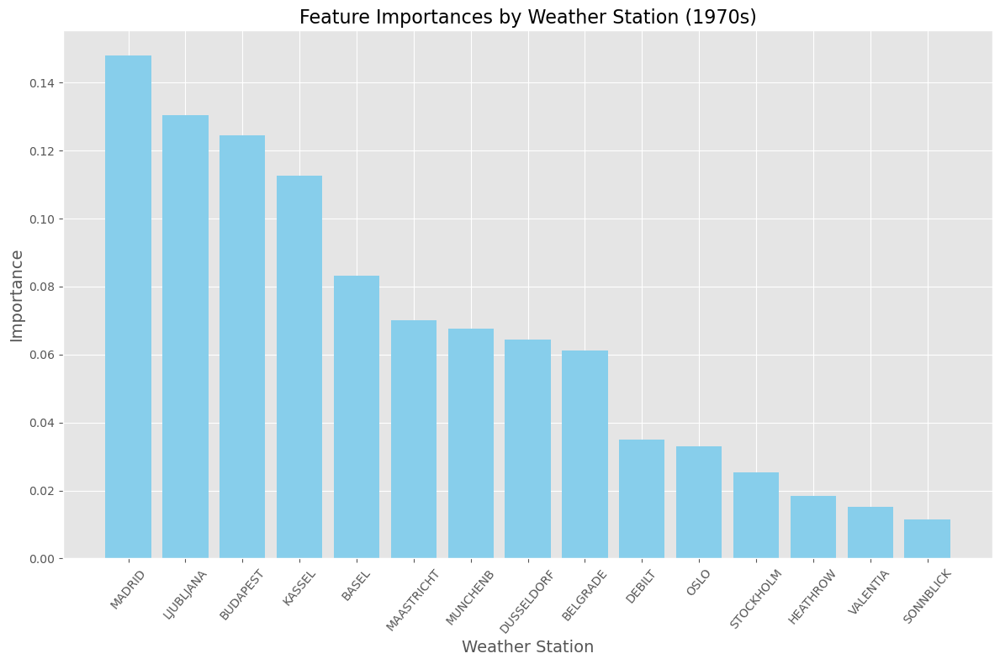

In [198]:
# Plot the importances

plt.style.use('ggplot')
plt70 = plt.figure(figsize=(12, 8))
plt.bar(df70['Weather Station'], df70['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Weather Station', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.title('Feature Importances by Weather Station (1970s)', fontsize=16)
plt.tight_layout()
plt.show()

#### 1980s

In [137]:
np.set_printoptions(threshold=np.inf)
importance80 = clf80.feature_importances_
print(importance80)

[0.00042431 0.00097798 0.00106667 0.00198584 0.00083385 0.00091546
 0.01668302 0.00099222 0.01636847 0.00096237 0.00165066 0.00068596
 0.01236273 0.00105747 0.00249983 0.0545069  0.01840006 0.02232097
 0.00054311 0.00183338 0.00084037 0.00338534 0.00115609 0.00149074
 0.07185336 0.0446103  0.04911641 0.0006411  0.00113041 0.00124692
 0.00167881 0.00080451 0.00060215 0.01333212 0.00119148 0.01540692
 0.00045468 0.00083893 0.00092163 0.00270972 0.00071067 0.00084698
 0.00725104 0.00532648 0.00801388 0.00048445 0.00110839 0.00109024
 0.00190579 0.00032244 0.00101723 0.00195027 0.00146466 0.00764001
 0.00053087 0.00089952 0.00085941 0.00164592 0.00089951 0.00059792
 0.02274102 0.00133075 0.0314575  0.00054264 0.00142298 0.00086531
 0.00335797 0.00074117 0.00155698 0.01455063 0.0130869  0.08049902
 0.00021796 0.00056448 0.00105074 0.00180925 0.00098697 0.00071184
 0.0073022  0.00101792 0.00699595 0.0016135  0.00230366 0.00137383
 0.01586503 0.00258096 0.0038516  0.07233617 0.00826316 0.1058

In [138]:
# Reshape the feature

newimportance80 = importance80.reshape(-1,15,9)
print(newimportance80.shape)
newimportance80

(1, 15, 9)


array([[[0.00042431, 0.00097798, 0.00106667, 0.00198584, 0.00083385,
         0.00091546, 0.01668302, 0.00099222, 0.01636847],
        [0.00096237, 0.00165066, 0.00068596, 0.01236273, 0.00105747,
         0.00249983, 0.0545069 , 0.01840006, 0.02232097],
        [0.00054311, 0.00183338, 0.00084037, 0.00338534, 0.00115609,
         0.00149074, 0.07185336, 0.0446103 , 0.04911641],
        [0.0006411 , 0.00113041, 0.00124692, 0.00167881, 0.00080451,
         0.00060215, 0.01333212, 0.00119148, 0.01540692],
        [0.00045468, 0.00083893, 0.00092163, 0.00270972, 0.00071067,
         0.00084698, 0.00725104, 0.00532648, 0.00801388],
        [0.00048445, 0.00110839, 0.00109024, 0.00190579, 0.00032244,
         0.00101723, 0.00195027, 0.00146466, 0.00764001],
        [0.00053087, 0.00089952, 0.00085941, 0.00164592, 0.00089951,
         0.00059792, 0.02274102, 0.00133075, 0.0314575 ],
        [0.00054264, 0.00142298, 0.00086531, 0.00335797, 0.00074117,
         0.00155698, 0.01455063, 0.0130869

In [139]:
# Sum the values across the last dimension to get one observation for each weather station
perstation80 = np.sum(newimportance80[0], axis=1)

# Check shape
print( perstation80.shape)
print(perstation80)

(15,)
[0.04024782 0.11444694 0.1748291  0.03603442 0.02707402 0.01698348
 0.06096242 0.11662359 0.02065732 0.21403131 0.04692544 0.05115413
 0.010004   0.05961996 0.01040604]


In [140]:
# Create a dataframe to associate weather stations with their importances
df80 = pd.DataFrame({
    'Weather Station': weather_stations,
    'Importance': perstation80
})

In [141]:
# Sort by importance 
df80 = df80.sort_values(by='Importance',ascending=False)
print(df80)

   Weather Station  Importance
9           MADRID    0.214031
2         BUDAPEST    0.174829
7        LJUBLJANA    0.116624
1         BELGRADE    0.114447
6           KASSEL    0.060962
13       STOCKHOLM    0.059620
11            OSLO    0.051154
10        MUNCHENB    0.046925
0            BASEL    0.040248
3           DEBILT    0.036034
4       DUSSELDORF    0.027074
8       MAASTRICHT    0.020657
5         HEATHROW    0.016983
14        VALENTIA    0.010406
12       SONNBLICK    0.010004


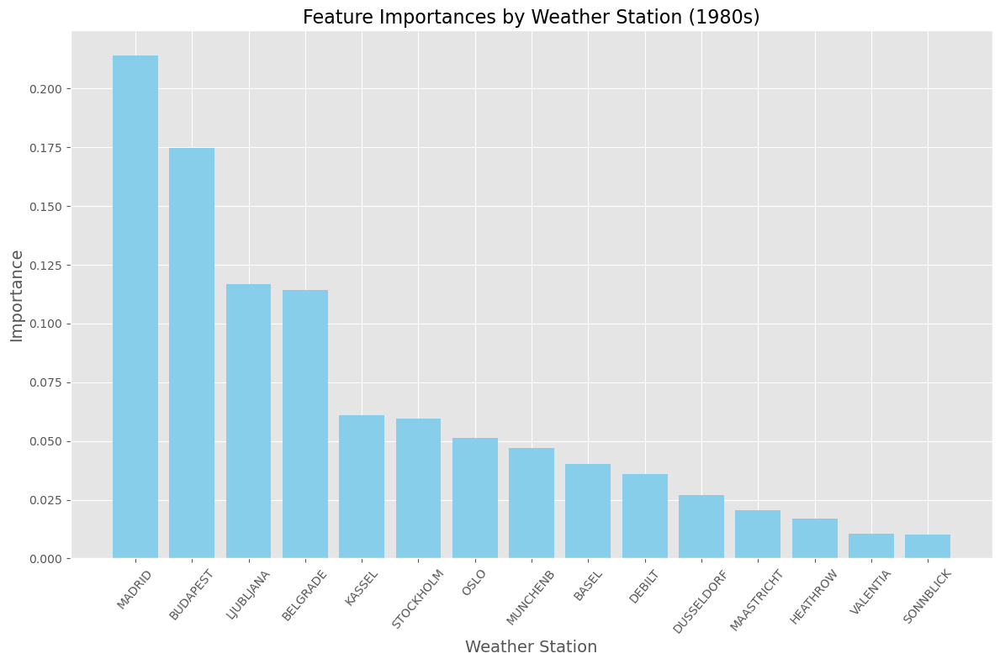

In [199]:
# Plot the importances

plt.style.use('ggplot')
plt70 = plt.figure(figsize=(12, 8))
plt.bar(df80['Weather Station'], df80['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Weather Station', fontsize=14)
plt.ylabel('Importance', fontsize=14)
plt.title('Feature Importances by Weather Station (1980s)', fontsize=16)
plt.tight_layout()
plt.show()

### Random Forest Model for the Top Three Influential Weather Stations

### Madrid

In [145]:
# filter weather data of Madrid weather station
MadridW = station[station.columns[station.columns.astype(str).str.startswith('MADRID')] ]
MadridW

,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max
0,6,0.92,1.0260,0.53,0.00,1.4,7.6,4.4,10.8
1,7,0.86,1.0254,0.46,0.00,0.9,9.8,7.4,12.2
2,5,0.90,1.0287,0.63,0.00,2.3,8.6,6.4,10.8
3,0,0.75,1.0281,1.16,0.00,8.7,10.3,4.5,16.1
4,2,0.64,1.0269,1.10,0.00,7.8,12.1,8.2,16.0
...,...,...,...,...,...,...,...,...,...
22945,8,0.52,1.0204,1.89,0.12,5.3,20.0,16.2,23.9
22946,8,0.51,1.0221,1.89,0.12,3.9,19.1,14.7,23.5
22947,8,0.46,1.0186,1.89,0.12,8.1,19.0,15.4,22.6
22948,5,0.66,1.0186,1.89,0.12,3.1,15.7,13.1,18.3


In [147]:
MadridW.shape

(22950, 9)

In [146]:
# Filter answers dataset to include Madrid only
MadridA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('MADRID')]]
MadridA


,MADRID_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [148]:
MadridA.shape

(22950, 1)

In [151]:
# Create y matrix
yM = MadridA.max(axis=1)

In [150]:
# Ensure correct shape
yM = yM.to_numpy().reshape(-1)
yM.shape

(22950,)

In [152]:
# Create X matrix
XM = MadridW.to_numpy()

In [153]:
XM.shape

(22950, 9)

In [154]:
# Split data into training and testing sets
X_trainM, X_testM, y_trainM, y_testM = train_test_split(XM, yM, random_state=42)

In [155]:
# Check shapes
print(X_trainM.shape, y_trainM.shape)
print(X_testM.shape, y_testM.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


### Random Forest

In [156]:
# creating a RF classifier
clfM = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfM.fit(X_trainM, y_trainM)

RandomForestClassifier()

In [157]:
# performing predictions on the test dataset
y_predM = clfM.predict(X_testM)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testM, y_predM))

Model Accuracy:  1.0


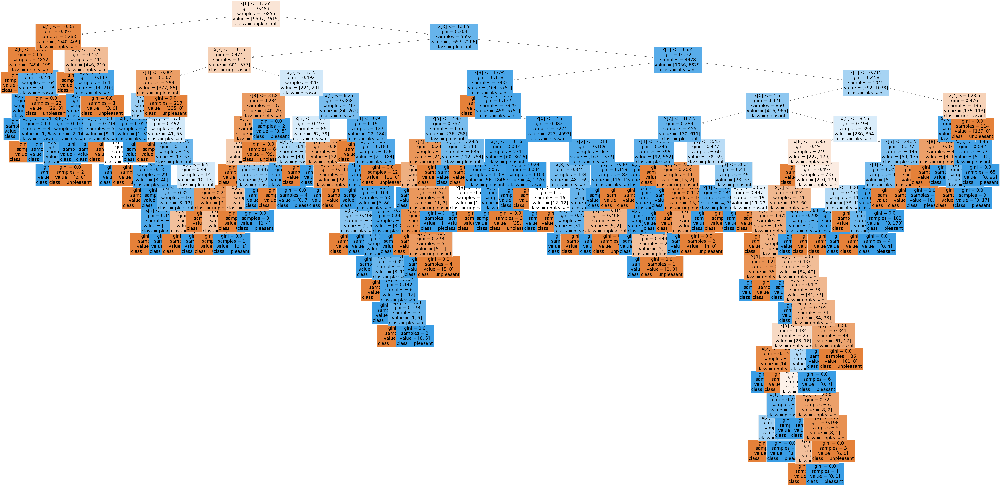

In [158]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfM.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

### Variable Importance

In [159]:
np.set_printoptions(threshold=np.inf)
importanceM = clfM.feature_importances_
print(importanceM)

[0.0160396  0.03566056 0.00414159 0.11211328 0.2097706  0.09760478
 0.18605089 0.04224725 0.29637144]


In [162]:
# Create list for observation measurements
measurements = [
    'cloud_cover', 'humidity', 'pressure', 'global_radiation', 
    'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max'
]

In [165]:
# Create a dataframe to associate observation measurements with their importances
IpM = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceM
})

In [166]:
# Sort by importance 
IpM = IpM.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceM)

Variable Importance:
[0.0160396  0.03566056 0.00414159 0.11211328 0.2097706  0.09760478
 0.18605089 0.04224725 0.29637144]


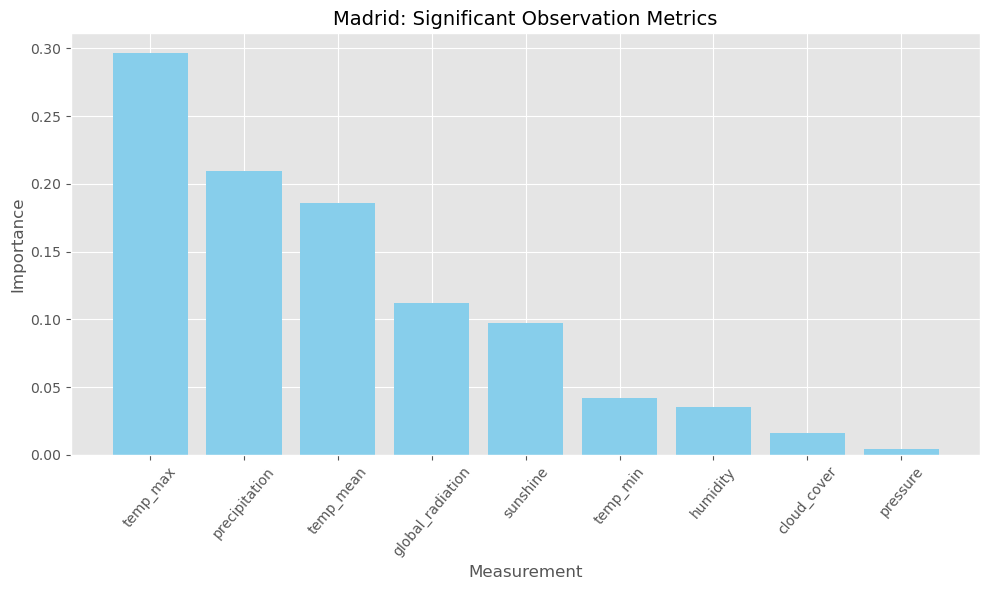

In [167]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpM['Measurement'], IpM['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Madrid: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()

### Budapest

In [168]:
# filter weather data of Budapest weather station
BudapestW = station[station.columns[station.columns.astype(str).str.startswith('BUDAPEST')] ]
BudapestW

,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max
0,4,0.67,1.017,0.44,0.01,2.3,2.4,-0.4,5.1
1,4,0.67,1.017,0.18,0.31,0.0,2.3,1.4,3.1
2,4,0.67,1.017,0.30,0.00,0.6,2.7,1.7,5.3
3,4,0.67,1.017,0.19,0.00,0.0,2.0,0.4,4.4
4,4,0.67,1.017,0.19,0.00,0.0,2.5,1.1,5.3
...,...,...,...,...,...,...,...,...,...
22945,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22946,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22947,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2
22948,4,0.67,1.017,1.41,0.14,5.4,11.7,7.9,16.2


In [169]:
# Filter answers dataset to include Budapest only
BudapestA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('BUDAPEST')]]
BudapestA

,BUDAPEST_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [170]:
# Create y matrix
yB = BudapestA.max(axis=1)

In [171]:
# Ensure correct shape
yB = yB.to_numpy().reshape(-1)
yB.shape

(22950,)

In [172]:
# Create X matrix
XB = BudapestW.to_numpy()

In [173]:
XB.shape

(22950, 9)

In [174]:
# Split data into training and testing sets
X_trainB, X_testB, y_trainB, y_testB = train_test_split(XB, yB, random_state=42)

In [175]:
# Check shapes
print(X_trainB.shape, y_trainB.shape)
print(X_testB.shape, y_testB.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


### Random Forest

In [176]:
# creating a RF classifier
clfB = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfB.fit(X_trainB, y_trainB)

RandomForestClassifier()

In [177]:
# performing predictions on the test dataset
y_predB = clfB.predict(X_testB)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testB, y_predB))

Model Accuracy:  1.0


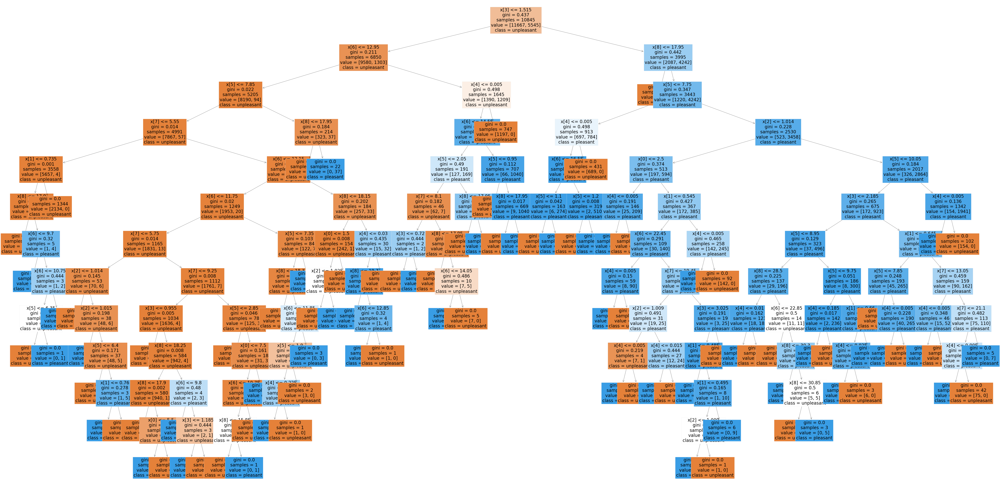

In [178]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfB.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

### Variable Importance

In [179]:
np.set_printoptions(threshold=np.inf)
importanceB = clfB.feature_importances_
print(importanceB)

[0.01358438 0.00682986 0.0045506  0.05807685 0.34889449 0.05263843
 0.172436   0.09144696 0.25154245]


In [180]:
# Create a dataframe to associate observation measurements with their importances
IpB = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceB
})

In [181]:
# Sort by importance 
IpB = IpB.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceB)

Variable Importance:
[0.01358438 0.00682986 0.0045506  0.05807685 0.34889449 0.05263843
 0.172436   0.09144696 0.25154245]


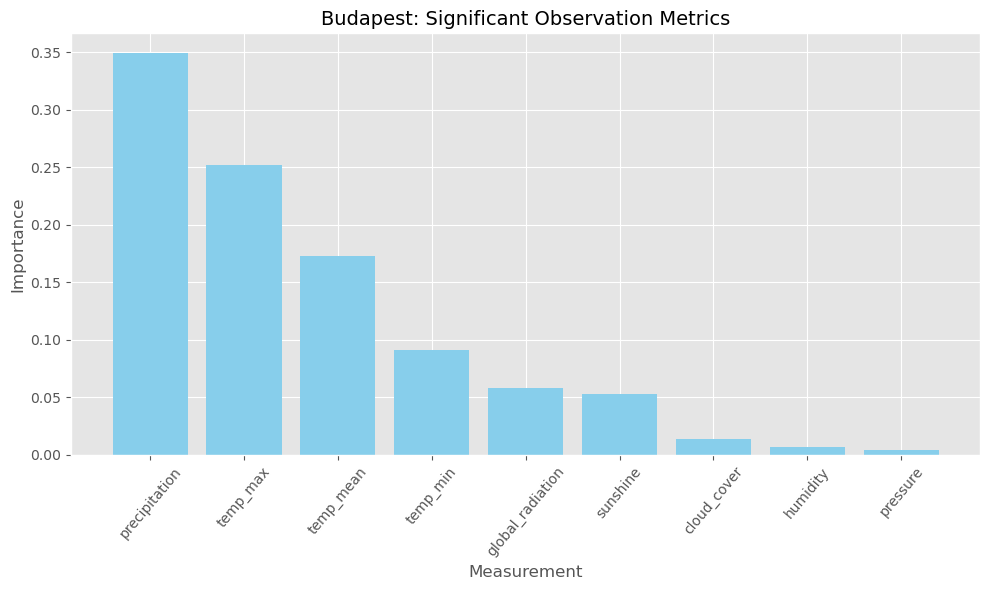

In [182]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpB['Measurement'], IpB['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Budapest: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()

### Ljubljana

In [183]:
# filter weather data of Ljubljana weather station
LjubljanaW = station[station.columns[station.columns.astype(str).str.startswith('LJUBLJANA')] ]
LjubljanaW

,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max
0,8,1.00,1.0173,0.20,0.00,0.0,-0.6,-1.9,0.5
1,6,0.94,1.0173,0.56,0.13,3.2,2.1,-1.3,5.5
2,8,0.96,1.0173,0.20,0.12,0.0,4.6,0.9,6.3
3,6,0.94,1.0173,0.49,0.00,2.2,3.2,1.0,7.0
4,7,0.94,1.0173,0.20,0.00,0.0,3.6,0.4,4.8
...,...,...,...,...,...,...,...,...,...
22945,4,0.80,1.0289,1.35,0.37,5.9,14.7,12.1,21.1
22946,3,0.82,1.0291,1.35,0.37,4.5,12.9,9.8,19.8
22947,3,0.81,1.0270,1.35,0.37,5.1,13.2,10.2,20.7
22948,3,0.77,1.0238,1.35,0.37,5.7,14.0,10.0,23.1


In [184]:
# Filter answers dataset to include Ljubljana only
LjubljanaA = picnic[picnic.columns[picnic.columns.astype(str).str.startswith('LJUBLJANA')]]
LjubljanaA

,LJUBLJANA_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [185]:
# Create y matrix
yL = LjubljanaA.max(axis=1)

In [186]:
# Ensure correct shape
yL = yL.to_numpy().reshape(-1)
yL.shape

(22950,)

In [187]:
# Create X matrix
XL = LjubljanaW.to_numpy()

In [188]:
XL.shape

(22950, 9)

In [189]:
# Split data into training and testing sets
X_trainL, X_testL, y_trainL, y_testL = train_test_split(XL, yL, random_state=42)

In [190]:
# Check shapes
print(X_trainL.shape, y_trainL.shape)
print(X_testL.shape, y_testL.shape)

(17212, 9) (17212,)
(5738, 9) (5738,)


### Random Forest

In [191]:
# creating a RF classifier
clfL = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clfL.fit(X_trainL, y_trainL)

RandomForestClassifier()

In [192]:
# performing predictions on the test dataset
y_predL = clfL.predict(X_testL)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_testL, y_predL))

Model Accuracy:  1.0


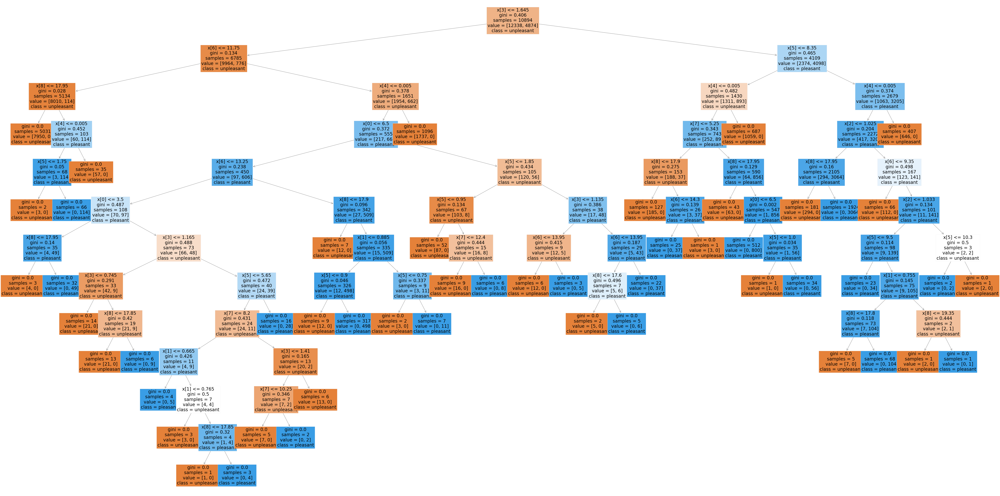

In [193]:
fig = plt.figure(figsize=(80,40))
plot_tree(clfL.estimators_[15], fontsize = 20, class_names=['unpleasant', 'pleasant'], filled=True);

### Variable Importance

In [194]:
np.set_printoptions(threshold=np.inf)
importanceL = clfL.feature_importances_
print(importanceL)

[0.04571235 0.01367645 0.00922646 0.09874975 0.36032118 0.10434268
 0.10198199 0.01457371 0.25141542]


In [195]:
# Create a dataframe to associate observation measurements with their importances
IpL = pd.DataFrame({
    'Measurement': measurements,
    'Importance': importanceL
})

In [196]:
# Sort by importance 
IpL = IpL.sort_values(by='Importance', ascending=False)
print("Variable Importance:")
print(importanceL)

Variable Importance:
[0.04571235 0.01367645 0.00922646 0.09874975 0.36032118 0.10434268
 0.10198199 0.01457371 0.25141542]


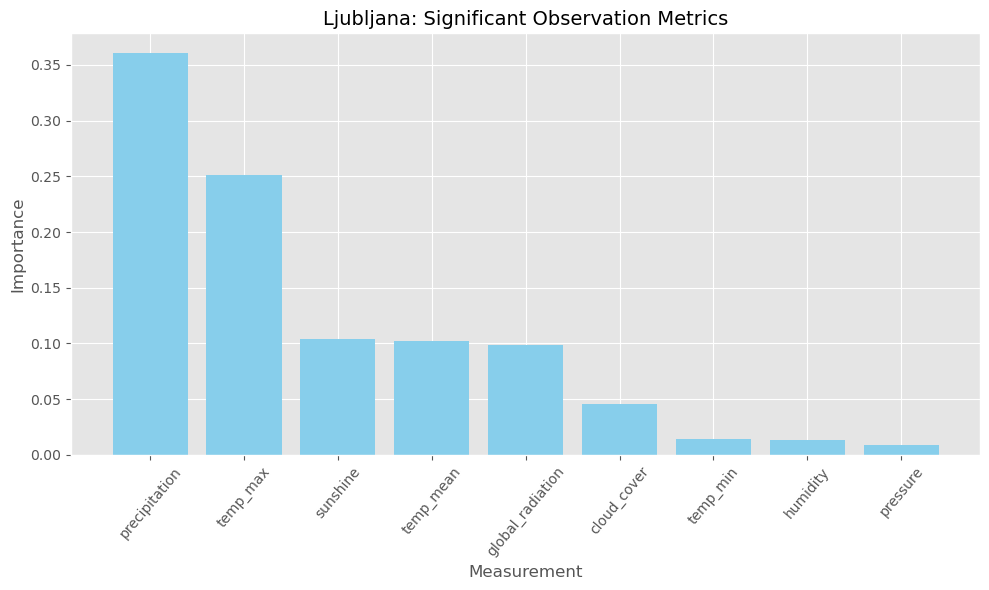

In [197]:
# Plot the importances

plt.style.use('ggplot')
plt_3 = plt.figure(figsize=(10, 6))
plt.bar(IpL['Measurement'], IpL['Importance'], color='skyblue')
plt.xticks(rotation=50, ha='center')
plt.xlabel('Measurement', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.title("Ljubljana: Significant Observation Metrics", fontsize=14)
plt.tight_layout()
plt.show()